# Plotting example for Boston 311 data

In this notebook we plot Boston's 311 data onto a map of Boston.

Data via https://data.boston.gov/dataset/311-service-requests

## Setup

In [1]:
lapply(c('hexbin', 'skimr'),
       function(pkg) { if(! pkg %in% installed.packages()) { install.packages(pkg)} } )

Installing package into ‘/home/jupyter-user/notebooks/packages’
(as ‘lib’ is unspecified)



[[1]]
NULL

[[2]]
NULL

In [2]:
library(httr)
library(skimr)
library(tidyverse)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.3     ✔ purrr   0.3.4
✔ tibble  3.1.1     ✔ dplyr   1.0.6
✔ tidyr   1.1.3     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



In [3]:
options(repr.plot.height = 14, repr.plot.width = 14)
theme_set(theme_gray(base_size = 18))

In [4]:
NUMBER_OF_LOCALITY_BINS = 90

# Download data

Data comes via a link from https://data.boston.gov/dataset/311-service-requests
It yields a 403 error but that page with the 403 also provides you with a resolved URL that 
contains a session token to download the raw data. By parsing the header, you can extract that 
resolved URL.

In [5]:
lookup <- HEAD("https://data.boston.gov/dataset/8048697b-ad64-4bfc-b090-ee00169f2323/resource/2be28d90-3a90-4af1-a3f6-f28c1e25880a/download/311_service_requests_2018.csv")
resolved_url <- ((lookup$all_headers[[1]])$headers)$location

In [6]:
dat <- read_csv(resolved_url)


── Column specification ────────────────────────────────────────────────────────
cols(
  .default = col_character(),
  case_enquiry_id = col_double(),
  open_dt = col_datetime(format = ""),
  target_dt = col_datetime(format = ""),
  closed_dt = col_datetime(format = ""),
  fire_district = col_double(),
  city_council_district = col_double(),
  neighborhood_services_district = col_double(),
  latitude = col_double(),
  longitude = col_double()
)
ℹ Use `spec()` for the full column specifications.




In [7]:
print(skim(dat))

── Data Summary ────────────────────────
                           Values
Name                       dat   
Number of rows             263105
Number of columns          29    
_______________________          
Column type frequency:           
  character                20    
  numeric                  6     
  POSIXct                  3     
________________________         
Group variables            None  

── Variable type: character ────────────────────────────────────────────────────
   skim_variable        n_missing complete_rate   min   max empty n_unique
 1 ontime                       1         1.00      6     7     0        2
 2 case_status                  0         1         4     6     0        2
 3 closure_reason           24406         0.907    22  3731     0   235924
 4 case_title                  47         1.00      1   176     0     3884
 5 subject                      0         1        14    33     0       11
 6 reason                       0         1         5

In [8]:
head(dat)

case_enquiry_id,open_dt,target_dt,closed_dt,ontime,case_status,closure_reason,case_title,subject,reason,⋯,police_district,neighborhood,neighborhood_services_district,ward,precinct,location_street_name,location_zipcode,latitude,longitude,source
<dbl>,<dttm>,<dttm>,<dttm>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>
101002296861,2018-01-01 00:08:00,NA,2018-03-01 15:18:12,ONTIME,Closed,Case Closed. Closed date : 2018-03-01 15:18:12.42 Case Resolved REPAIRED HYDRANT 2/26,Fire Hydrant,Boston Water & Sewer Commission,Fire Hydrant,⋯,E13,Jamaica Plain,11,Ward 19,1903,413 Centre St,02130,42.3214,-71.1109,Constituent Call
101002296862,2018-01-01 00:09:46,2018-01-02 08:30:00,2018-01-02 21:15:22,OVERDUE,Closed,Case Closed. Closed date : 2018-01-02 21:15:22.323 Duplicate of Existing Case,Parking Enforcement,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,⋯,C6,South Boston / South Boston Waterfront,5,Ward 6,0604,428 W Second St,02127,42.3373,-71.0445,Citizens Connect App
101002296864,2018-01-01 00:11:24,2018-01-02 08:30:00,2018-01-02 21:15:11,OVERDUE,Closed,Case Closed. Closed date : 2018-01-02 21:15:11.62 Case Noted clear,Parking Enforcement,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,⋯,C6,South Boston / South Boston Waterfront,5,Ward 6,0604,401-403 W Second St,02127,42.3371,-71.0442,Citizens Connect App
101002296865,2018-01-01 00:19:06,2018-01-02 08:30:00,2018-01-02 21:14:48,OVERDUE,Closed,Case Closed. Closed date : 2018-01-02 21:14:48.407 Duplicate of Existing Case,Parking Enforcement,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,⋯,B3,Dorchester,9,17,1701,INTERSECTION School St & Washington St,NA,42.3594,-71.0587,Citizens Connect App
101002296866,2018-01-01 00:21:25,2018-01-02 08:30:00,2018-01-02 21:14:32,OVERDUE,Closed,Case Closed. Closed date : 2018-01-02 21:14:32.94 Duplicate of Existing Case,Parking Enforcement,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,⋯,B3,Dorchester,9,Ward 17,1701,6-8 School St,02124,42.2965,-71.0729,Citizens Connect App
101002296868,2018-01-01 00:51:00,NA,2018-01-01 13:18:04,ONTIME,Closed,Case Closed. Closed date : 2018-01-01 13:18:04.193 Case Resolved caller canceled found owner,Animal Found,Animal Control,Animal Issues,⋯,B3,Dorchester,9,Ward 17,1701,22-24 Thane St,02124,42.2967,-71.0764,Constituent Call


# Examine count of reports per locality

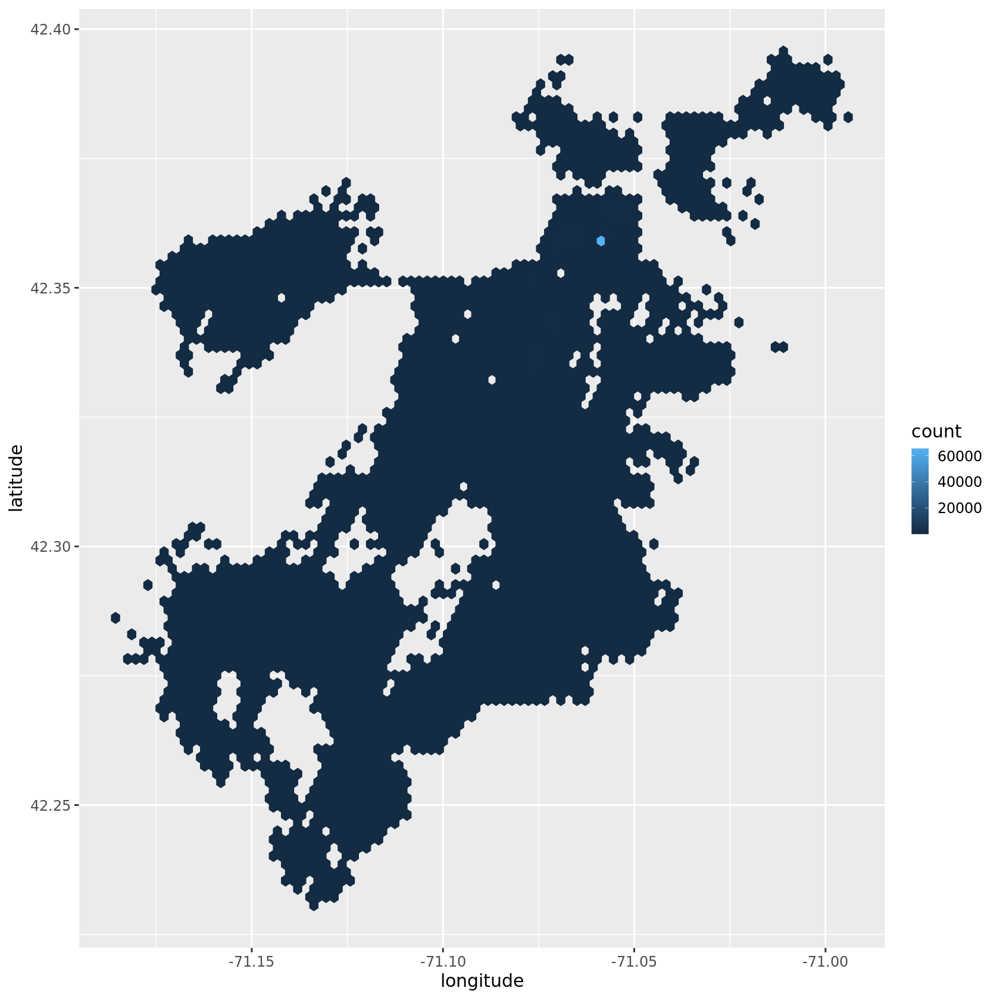

In [9]:
ggplot(dat) +
  geom_hex(aes(longitude, latitude, col=..count..), bins = NUMBER_OF_LOCALITY_BINS)

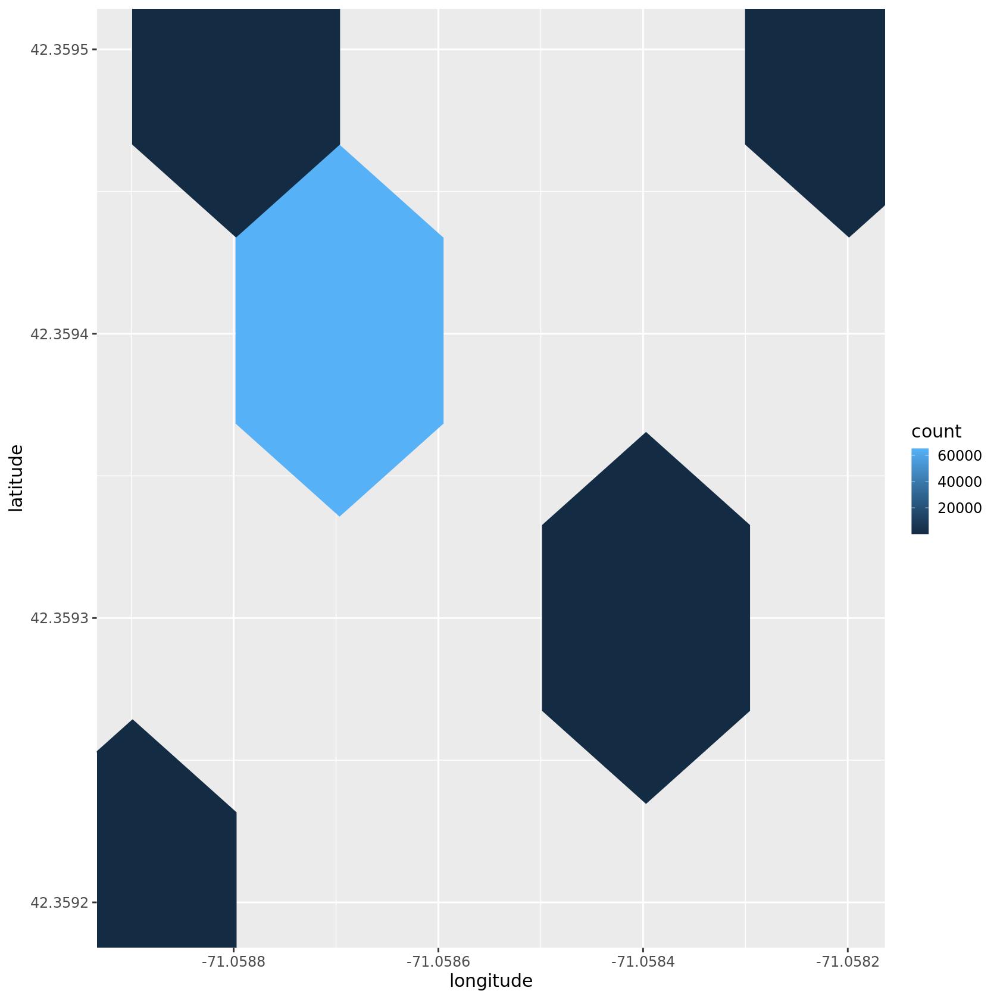

In [10]:
ggplot(dat[dat$longitude < -71.058 & dat$longitude > -71.059 & dat$latitude < 42.36 & dat$latitude > 42.359,]) +
  geom_hex(aes(longitude, latitude, col=..count..), bins = NUMBER_OF_LOCALITY_BINS)

In [11]:
length(dat[dat$latitude==42.3594 & dat$longitude==-71.0587,1])

[1] 1

It looks like any report without GPS coordinates gets assigned to City Hall.

Let's remove City Hall and see how the report density actually varies:

In [12]:
notCityHall <- dat[!(dat$latitude==42.3594 & dat$longitude==-71.0587),]

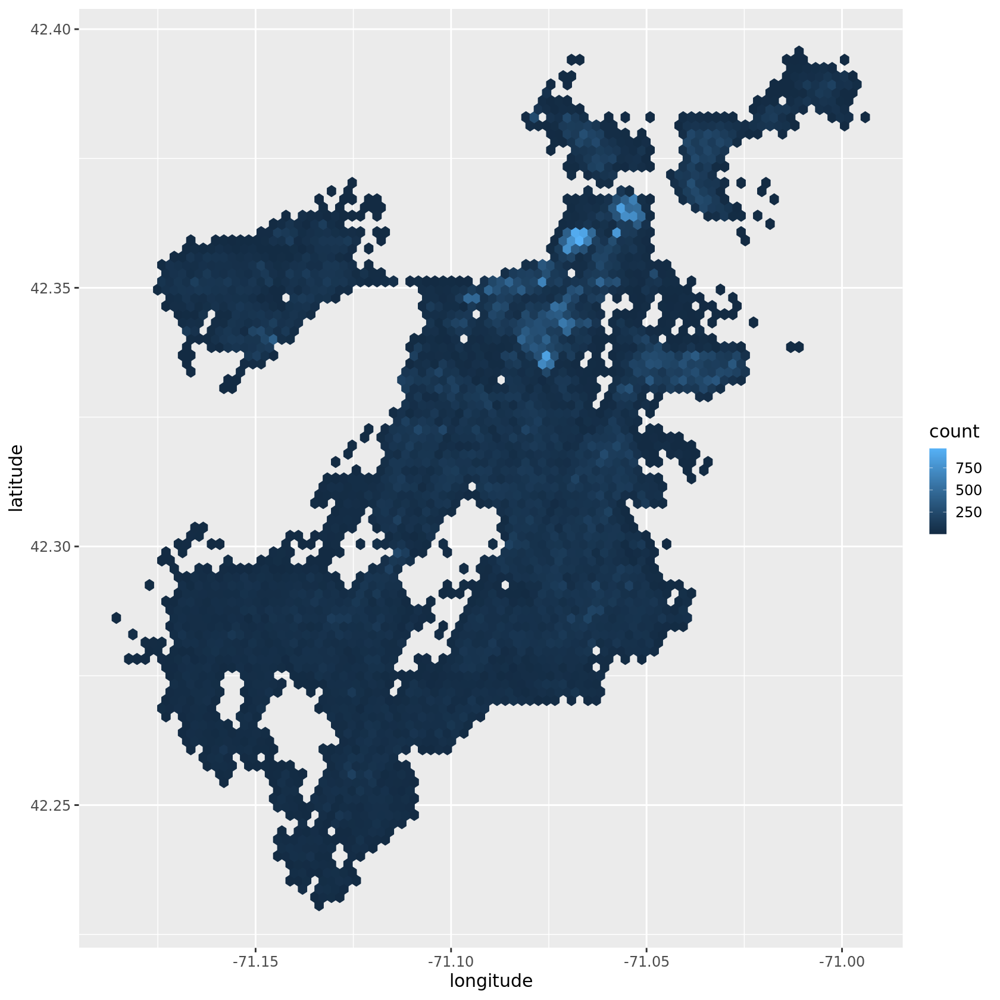

In [13]:
ggplot(notCityHall) +
  geom_hex(aes(longitude, latitude, col=..count..), bins = NUMBER_OF_LOCALITY_BINS)

# Needle pickup requests

In [14]:
needleCases <- notCityHall[grep("Needle", notCityHall$case_title), ]

In [15]:
nrow(needleCases)

[1] 3382

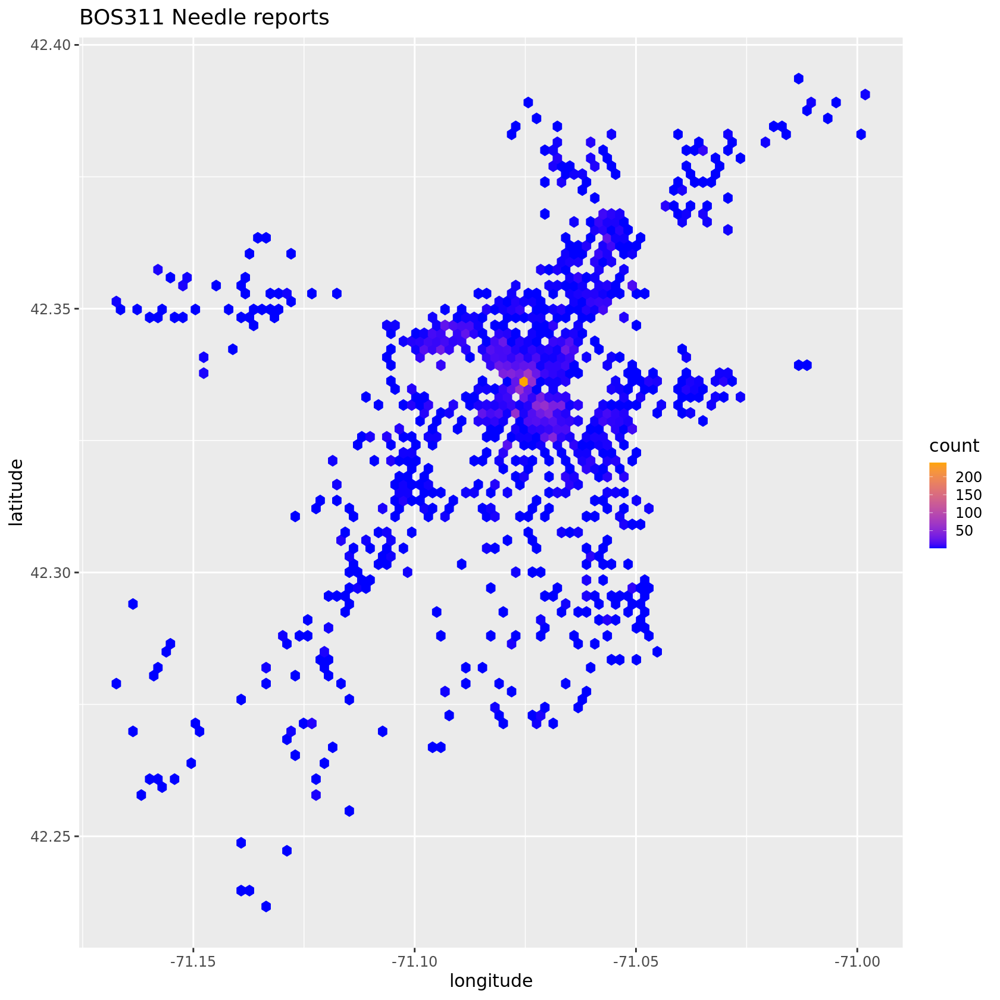

In [16]:
ggplot(needleCases) +
  geom_hex(aes(longitude, latitude, col=..count..), bins = NUMBER_OF_LOCALITY_BINS) + 
  scale_colour_gradient(low = "blue", high = "orange") +
  scale_fill_gradient(low = "blue", high = "orange") +
  ggtitle("BOS311 Needle reports")

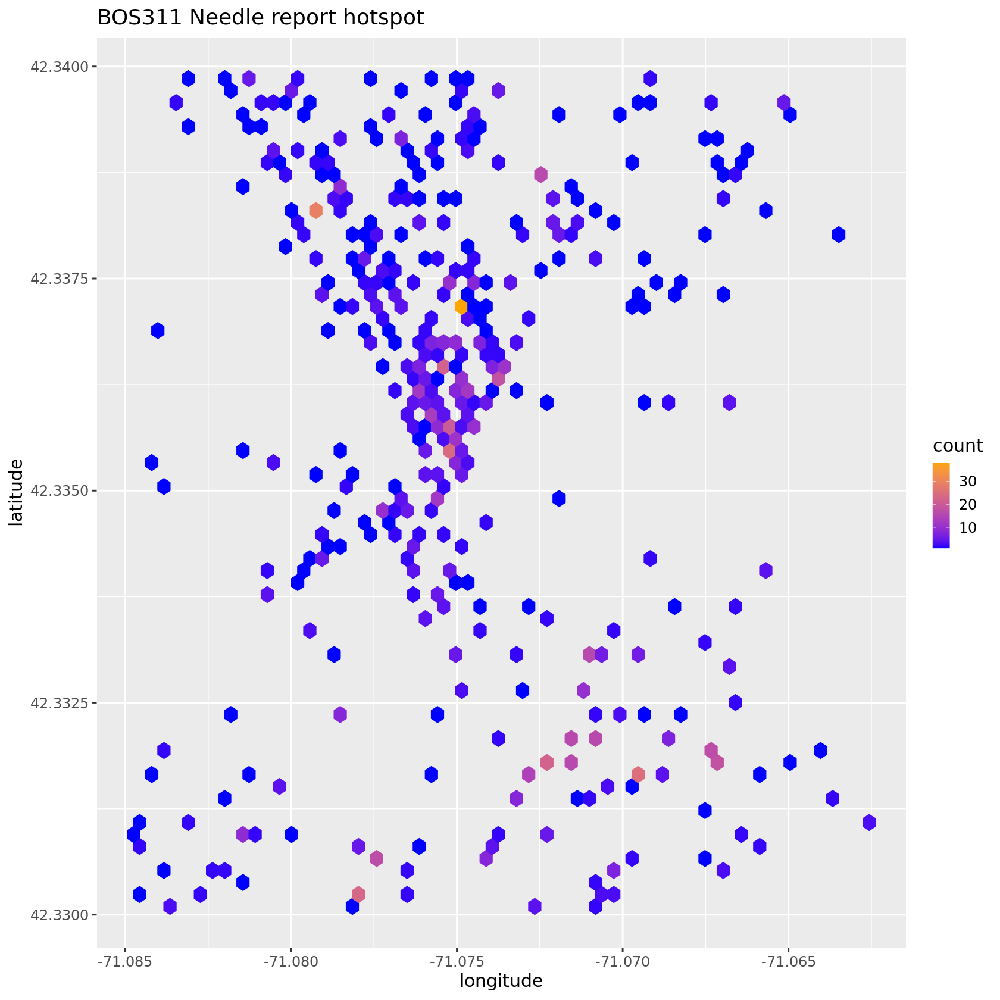

In [17]:
ggplot(needleCases[with(needleCases, latitude>42.33 & latitude < 42.34 & longitude > -71.085 & longitude < -71.06),]) +
  geom_hex(aes(longitude, latitude, col=..count..), bins=60) + 
  scale_colour_gradient(low = "blue", high = "orange") +
  scale_fill_gradient(low = "blue", high = "orange") +
  ggtitle("BOS311 Needle report hotspot")

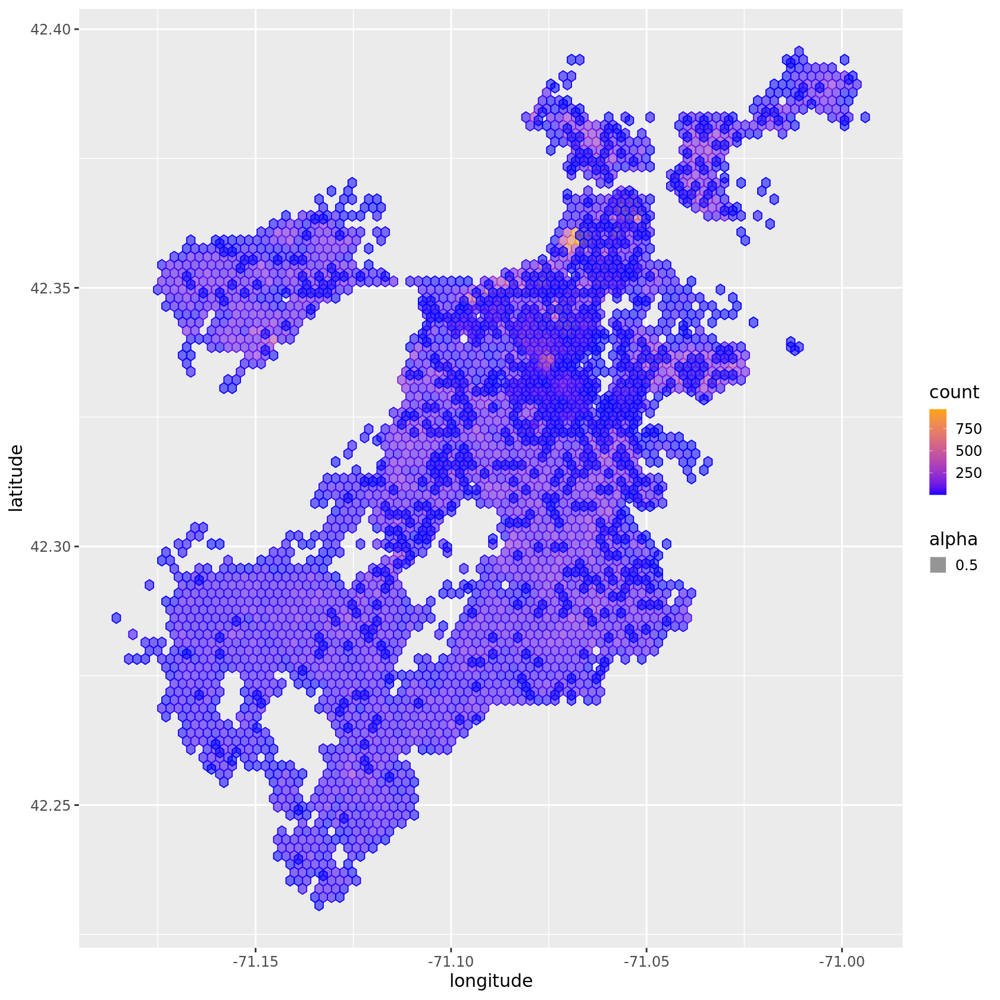

In [18]:
# Note: this is a failed overlay of the generic request density map and the needle pickup map
ggplot(notCityHall) + 
  geom_hex(aes(longitude, latitude, alpha=0.5, col=..count..), bins = NUMBER_OF_LOCALITY_BINS) +
  geom_hex(data=needleCases, aes(longitude, latitude, alpha=0.5, col=..count..), bins = NUMBER_OF_LOCALITY_BINS) +
  scale_colour_gradient(low = "blue", high = "orange") +
  scale_fill_gradient(low = "blue", high = "orange")

# What else can we plot?

In [19]:
top_case_types <- notCityHall %>%
    group_by(type) %>%
    summarize(
        count = n()
    ) %>%
    arrange(desc(count)) %>%
    head(n=20)

top_case_types

type,count
<chr>,<int>
Parking Enforcement,29091
Missed Trash/Recycling/Yard Waste/Bulk Item,13853
Requests for Street Cleaning,13380
Improper Storage of Trash (Barrels),12667
Schedule a Bulk Item Pickup,10503
Request for Pothole Repair,10247
CE Collection,7714
Poor Conditions of Property,5467
Street Light Outages,5220


In [20]:
plotBOS <- function(df, case_type) {
  p <- ggplot(notCityHall %>% filter(type == case_type)) +
    geom_hex(aes(longitude, latitude, col=..count..), bins = NUMBER_OF_LOCALITY_BINS) + 
    scale_colour_gradient(low = "blue", high = "orange") +
    scale_fill_gradient(low = "blue", high = "orange") +
    ggtitle(case_type)
  print(p)
}

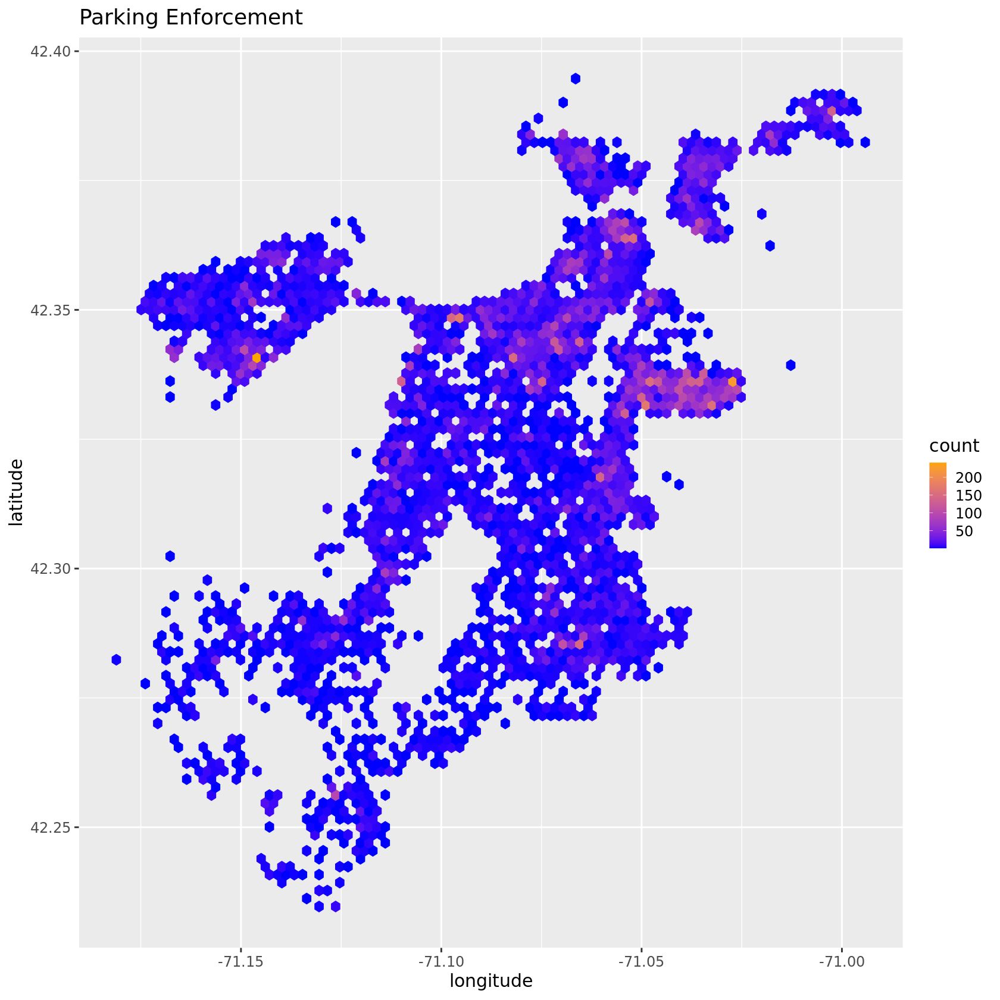

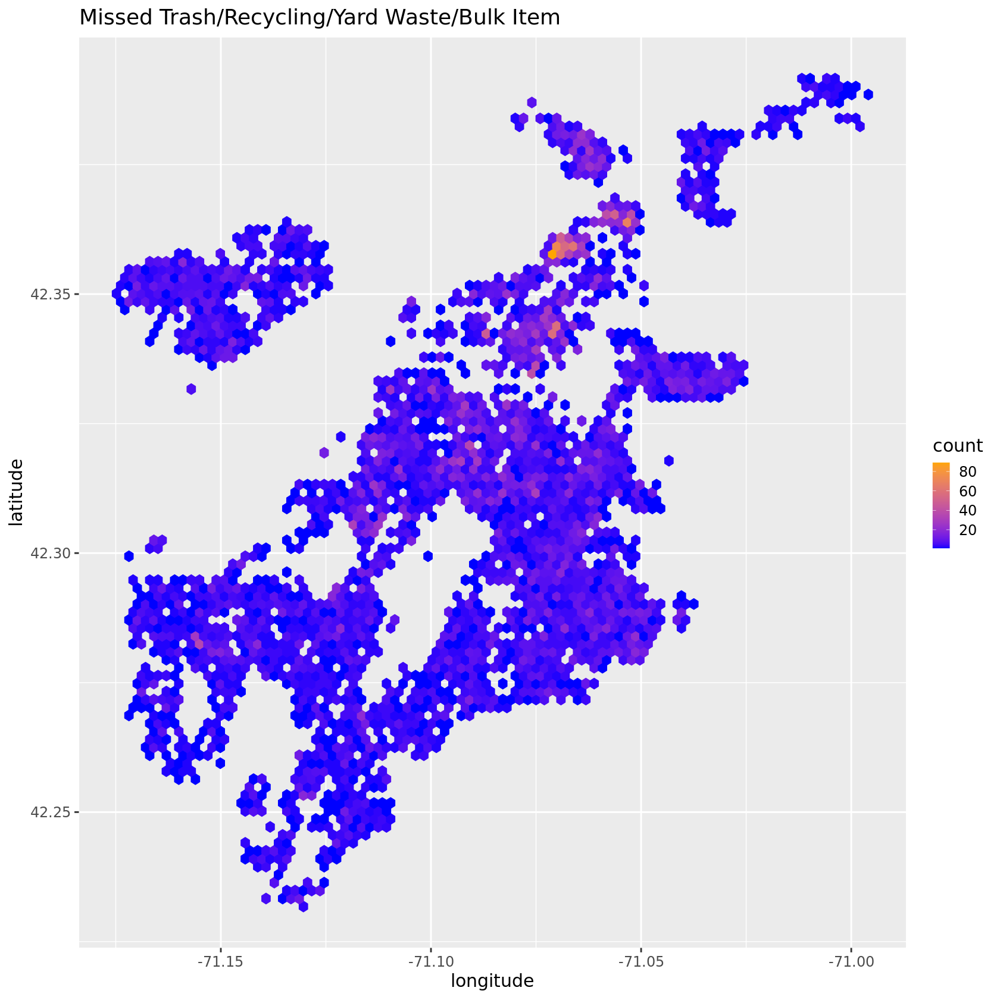

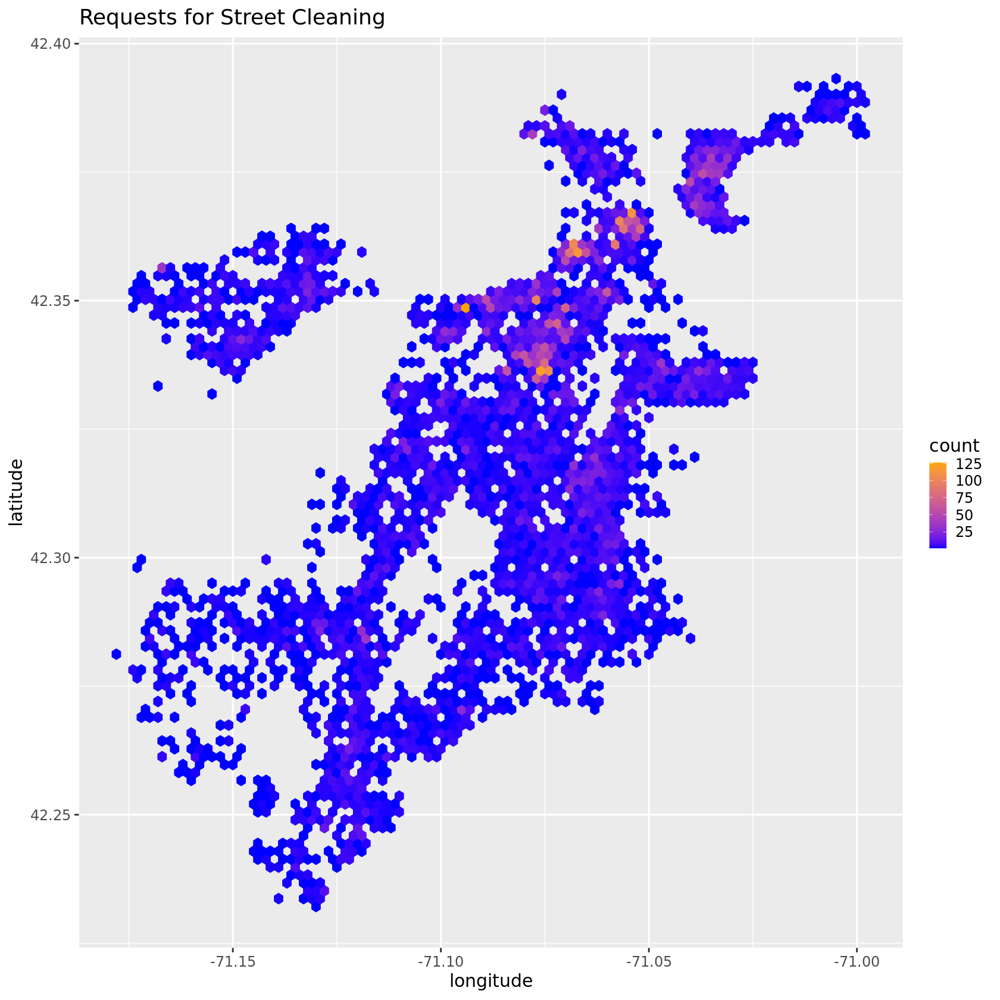

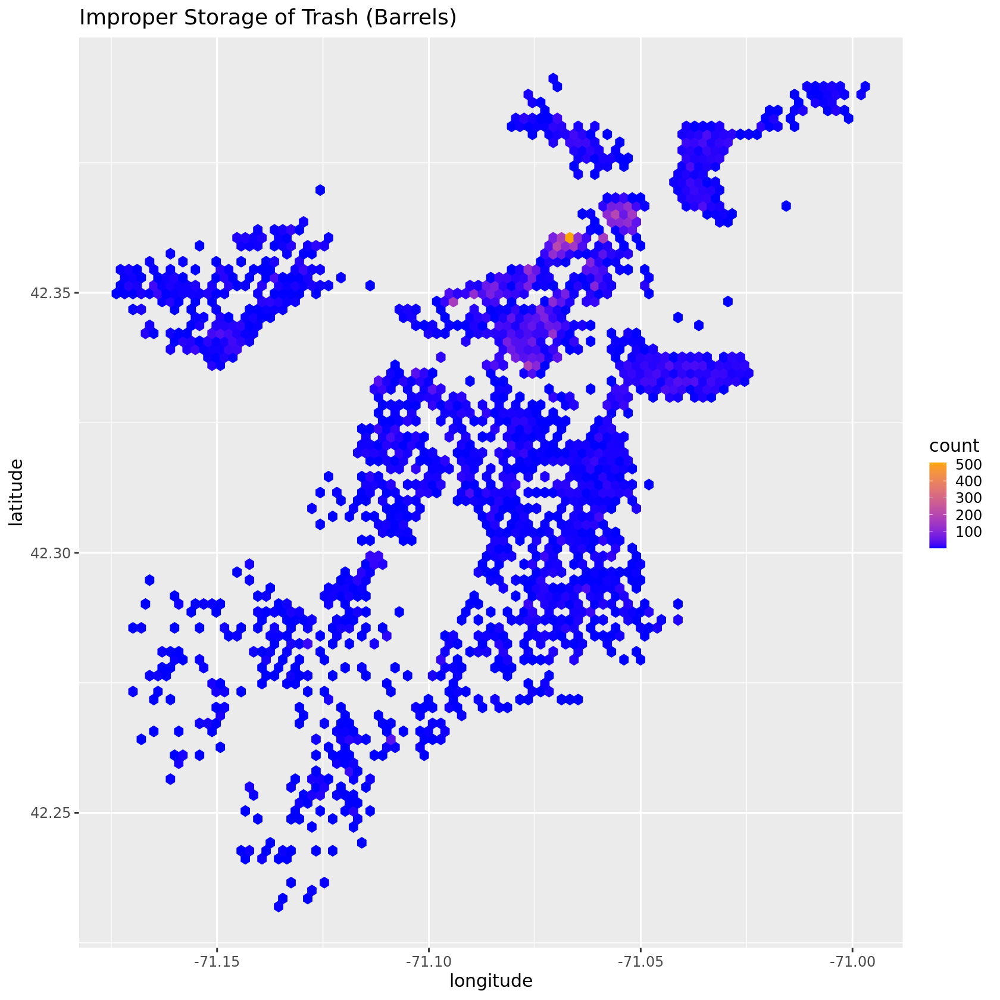

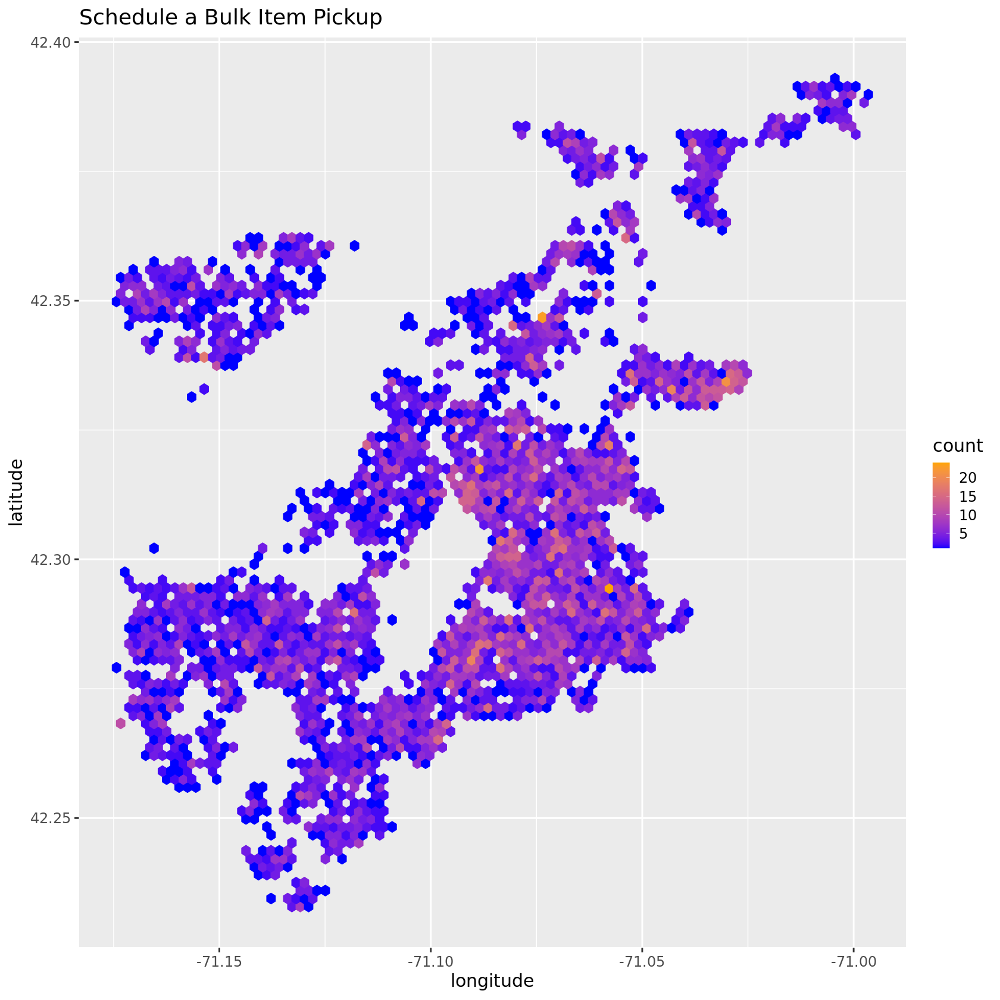

...

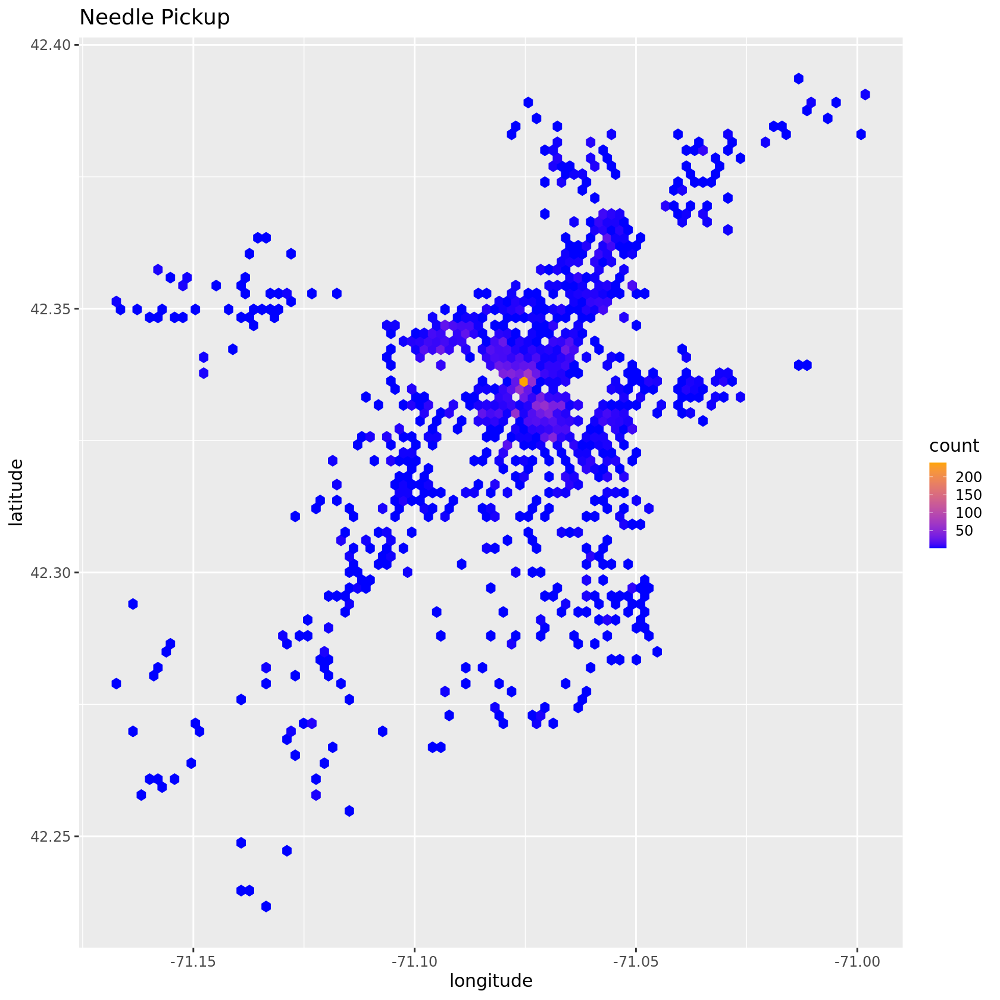

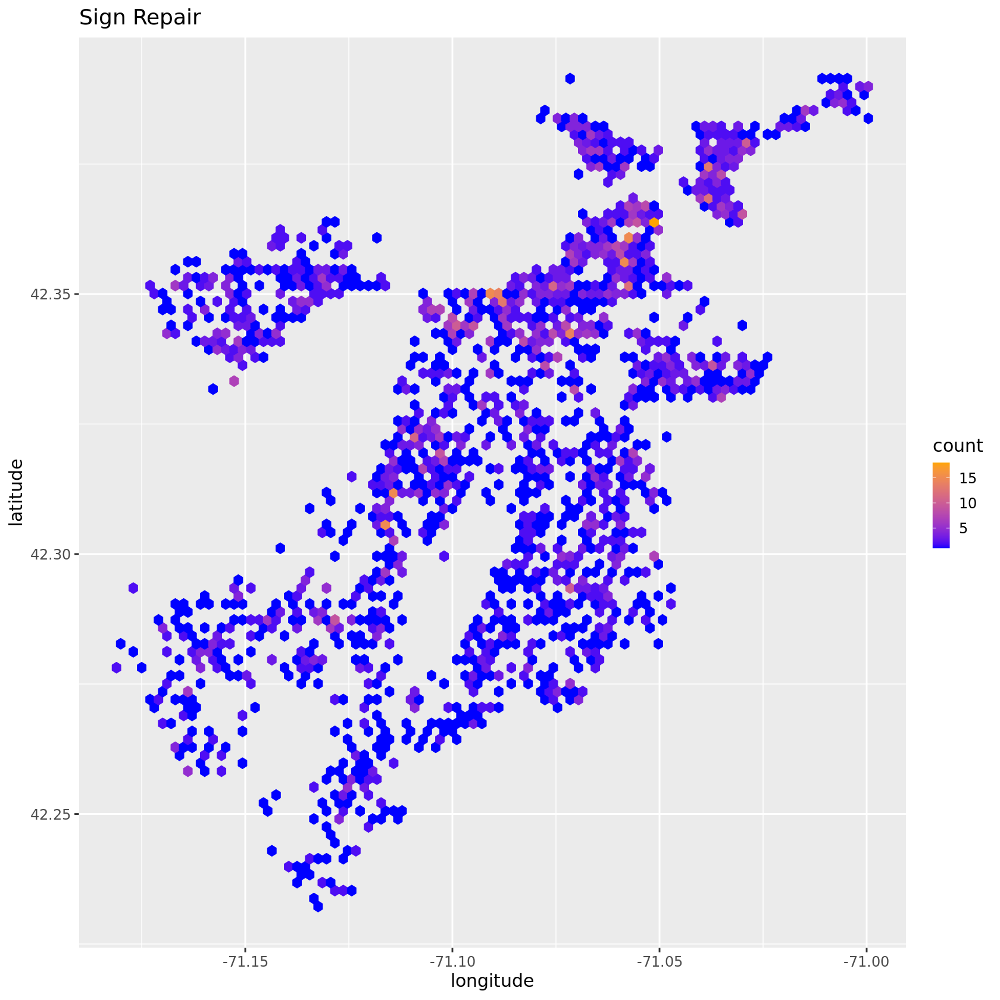

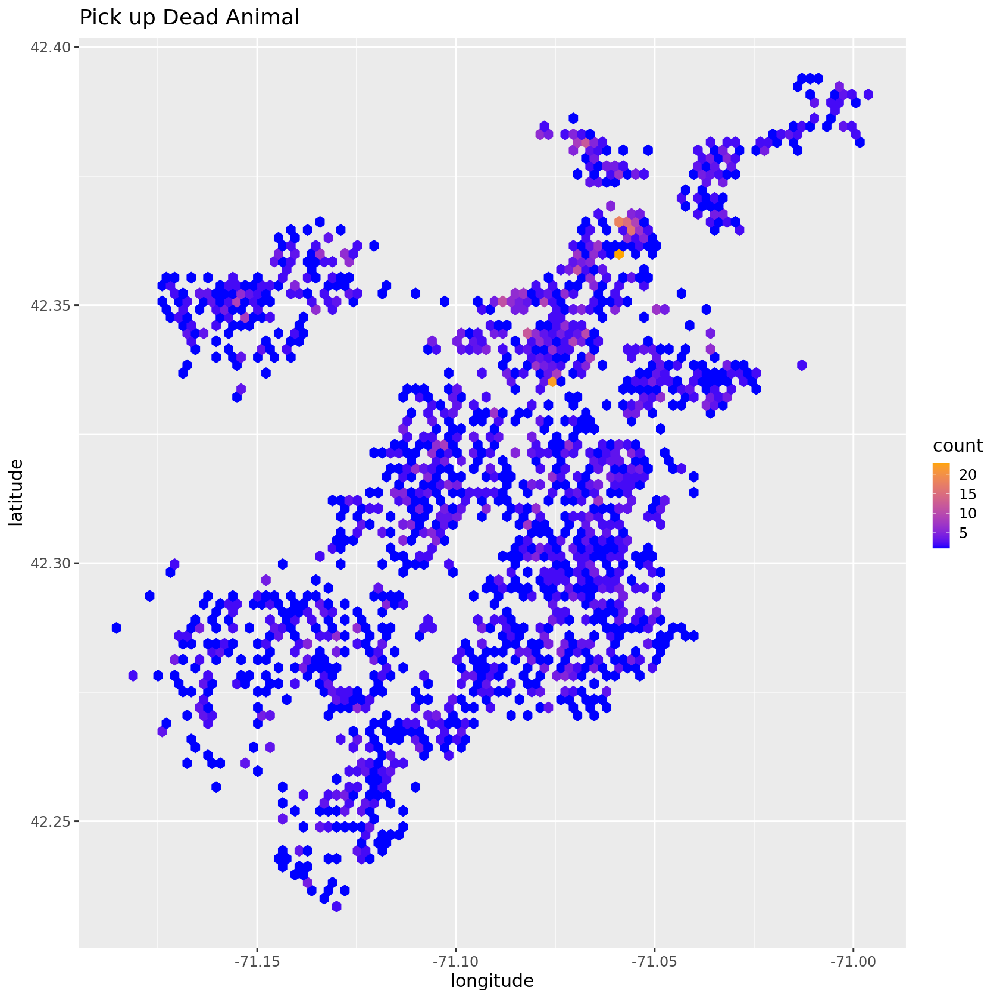

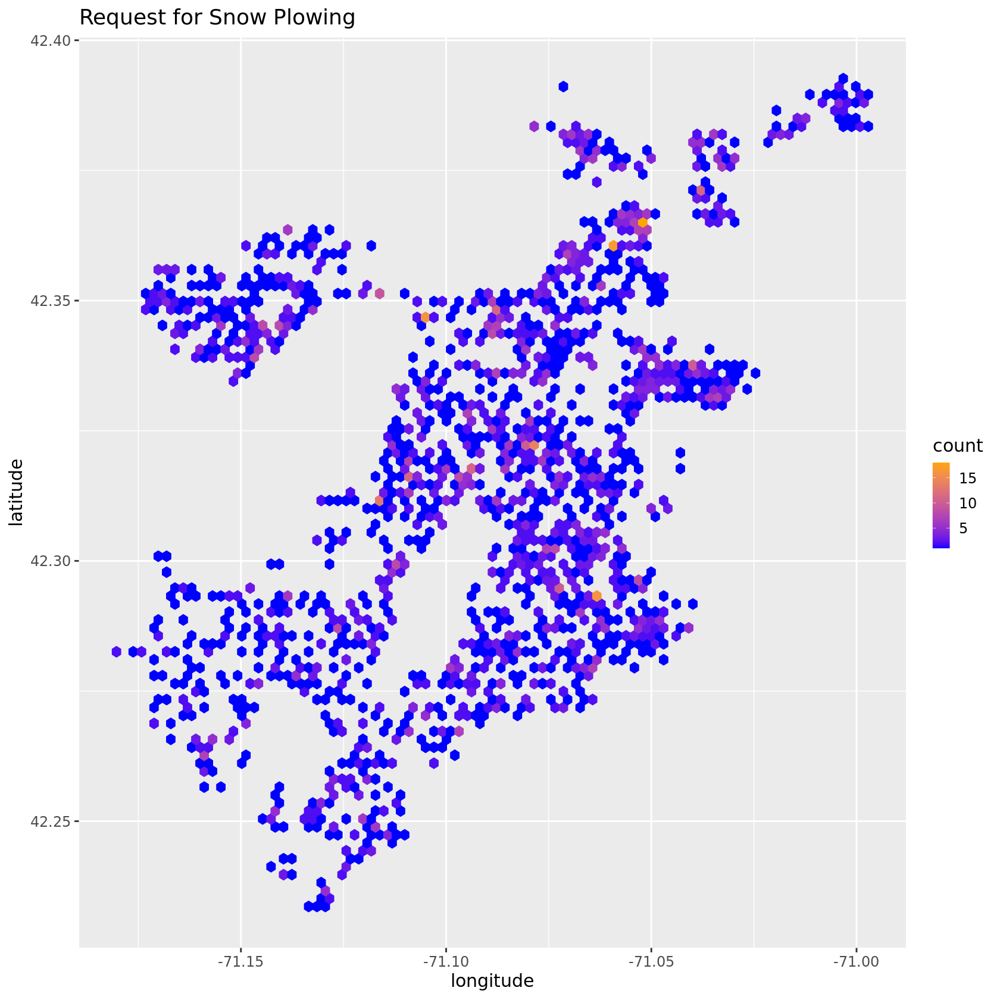

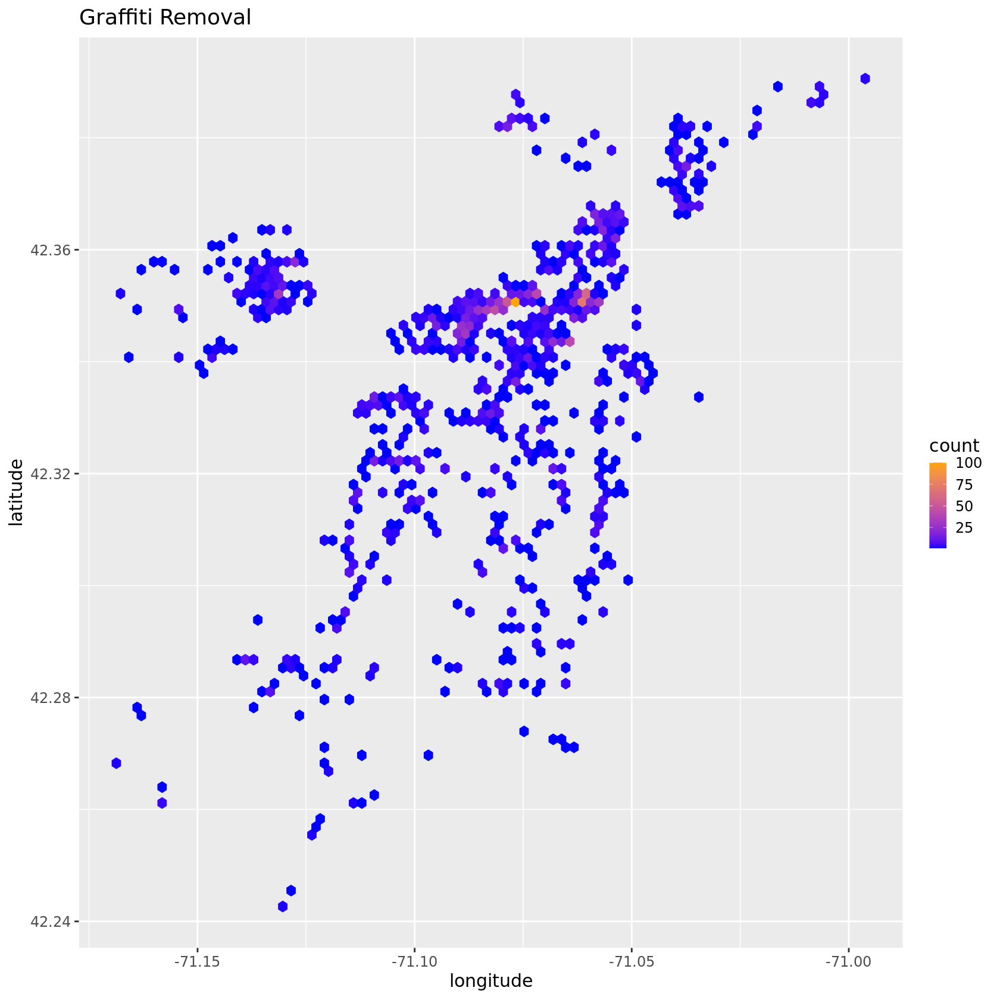

In [21]:
for (x in top_case_types$type) {
    plotBOS(notCityHall, case_type = x)
}

# Provenance

In [22]:
devtools::session_info()

─ Session info ───────────────────────────────────────────────────────────────
 setting  value                       
 version  R version 4.0.5 (2021-03-31)
 os       Ubuntu 18.04.5 LTS          
 system   x86_64, linux-gnu           
 ui       X11                         
 language (EN)                        
 collate  en_US.UTF-8                 
 ctype    en_US.UTF-8                 
 tz       Etc/UTC                     
 date     2021-05-19                  

─ Packages ───────────────────────────────────────────────────────────────────
 package     * version date       lib source        
 assertthat    0.2.1   2019-03-21 [2] CRAN (R 4.0.5)
 backports     1.2.1   2020-12-09 [2] CRAN (R 4.0.5)
 base64enc     0.1-3   2015-07-28 [2] CRAN (R 4.0.5)
 broom         0.7.6   2021-04-05 [2] CRAN (R 4.0.5)
 cachem        1.0.4   2021-02-13 [2] CRAN (R 4.0.5)
 callr         3.7.0   2021-04-20 [2] CRAN (R 4.0.5)
 cellranger    1.1.0   2016-07-27 [2] CRAN (R 4.0.5)
 cli           2.5.0   2021

Copyright 2018 The Broad Institute, Inc., Verily Life Sciences, LLC All rights reserved.

This software may be modified and distributed under the terms of the BSD license. See the LICENSE file for details.